In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('Hand_digit.csv')
df.head(4)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
df.shape

(42000, 785)

In [4]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
8128,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


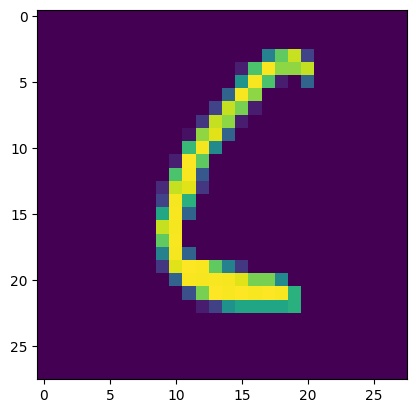

In [5]:
plt.imshow(df.iloc[2051,1:].values.reshape(28,28))

In [6]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=.2)

In [5]:
X_train.shape

(33600, 784)

In [8]:
from sklearn.neighbors import KNeighborsClassifier

In [9]:
knn = KNeighborsClassifier()

In [10]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [11]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)

27.842175006866455


In [12]:
from sklearn.metrics import accuracy_score
accuracy_score(y_pred, y_test)

0.9667857142857142

In [13]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [14]:
X_train_transformed = sc.fit_transform(X_train)
X_test_transformed = sc.transform(X_test)

In [15]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=100)

In [16]:
X_train_pca = pca.fit_transform(X_train_transformed)
X_test_pca = pca.transform(X_test_transformed)

In [14]:
X_train_pca.shape

(33600, 100)

In [17]:
knn.fit(X_train_pca,y_train)

KNeighborsClassifier()

In [20]:
y_pred_pca = knn.predict(X_test_pca)

In [21]:
accuracy_score(y_pred_pca,y_test)

0.9539285714285715

In [ ]:
for i in range(1,784):
    pca = PCA(n_components=i)
    X_train_pca = pca.fit_transform(X_train_transformed)
    X_test_pca = pca.transform(X_test_transformed)
    k
    knn.fit(X_train_pca,y_train)
    print(accuracy_score(y_pred_pca,y_test))

In [18]:
pca = PCA(n_components=2)

In [19]:
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [53]:
X_train_pca

array([[ 484.64039379,  -86.61943896],
       [-182.31389264, -190.19806909],
       [ -60.87072678,  642.9713829 ],
       ...,
       [ 106.99700376,  155.0659507 ],
       [-705.66675201, -824.02475829],
       [-113.84582796,  239.41453421]])

In [20]:
import plotly.express as px

In [21]:
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_pca[:,0],
                 y=X_train_pca[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [22]:
pca = PCA(n_components=3)
X_train_pca3d = pca.fit_transform(X_train)
X_test_pca3d = pca.transform(X_test)

In [23]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(x=X_train_pca3d[:,0],
                 y=X_train_pca3d[:,1],
                 z=X_train_pca3d[:,2],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [24]:
# Eigen Values
pca.explained_variance_

array([335660.26675438, 246877.92205054, 211469.18685276])

In [25]:
# Eigen Vector
print(pca.components_)
print()
print(pca.components_.shape)

[[ 1.26593638e-17  2.02288770e-19  9.26162988e-19 ... -0.00000000e+00
  -0.00000000e+00 -0.00000000e+00]
 [-6.17484761e-17  4.72839873e-17 -9.26583541e-18 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 3.99587383e-17  1.30810553e-16  1.15301159e-17 ... -0.00000000e+00
  -0.00000000e+00 -0.00000000e+00]]

(3, 784)


In [33]:
pca.components_[0]

array([ 1.26593638e-17,  2.02288770e-19,  9.26162988e-19, -2.55853573e-19,
        6.39245887e-20,  3.83903598e-20,  8.47657141e-21, -3.35884127e-21,
        8.73047783e-22,  2.60088277e-22,  3.87980403e-23, -2.28135116e-22,
       -1.83512266e-07, -3.96386495e-06, -3.96386495e-06, -1.65161039e-07,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
        4.46155223e-07,  1.31058097e-06,  7.60020245e-06,  1.94093407e-05,
        1.62774573e-05,  3.76324009e-05,  1.11081583e-04,  1.10845020e-04,
        5.65948951e-05,  5.00621519e-05,  6.13537213e-05,  6.00744049e-05,
        2.12099364e-05,  2.68159365e-05,  3.99865160e-05,  1.37520734e-05,
       -2.87471909e-06,  8.61467047e-06,  3.65462003e-06, -2.42208998e-07,
       -0.00000000e+00, -

In [78]:
pca = PCA(n_components=90)
X_train_pca3d = pca.fit_transform(X_train)
X_test_pca3d = pca.transform(X_test)

In [79]:
pca.components_.shape

(90, 784)

In [80]:
np.cumsum(pca.explained_variance_ratio_)

array([0.09771382, 0.16935672, 0.23084596, 0.28471442, 0.33373813,
       0.37645592, 0.40925284, 0.4381842 , 0.46590003, 0.48941865,
       0.51039801, 0.53092855, 0.54798096, 0.56493365, 0.58073565,
       0.59563911, 0.60887113, 0.62165478, 0.63349495, 0.64506732,
       0.65579822, 0.66595173, 0.67556487, 0.68475155, 0.69365054,
       0.70200464, 0.71006837, 0.71780877, 0.72524919, 0.73214472,
       0.73870373, 0.74511419, 0.75106287, 0.75694177, 0.76255914,
       0.76794576, 0.77303496, 0.77789726, 0.78269268, 0.78734093,
       0.79186504, 0.79632675, 0.80049105, 0.80446064, 0.80831966,
       0.81206074, 0.8156543 , 0.81913666, 0.82250685, 0.82572544,
       0.82886609, 0.83193369, 0.83486852, 0.83774713, 0.84055563,
       0.84326244, 0.84592513, 0.84847684, 0.85101894, 0.85348711,
       0.85587776, 0.85825734, 0.86053223, 0.86272835, 0.86487423,
       0.86693893, 0.86897953, 0.87092867, 0.87286055, 0.8747377 ,
       0.876604  , 0.87842387, 0.88019865, 0.88191256, 0.88357

In [65]:
np.cumsum(pca.explained_variance_ratio_)

array([0.09771382, 0.16935672, 0.23084596, 0.28471442, 0.33373813,
       0.37645592, 0.40925284, 0.4381842 , 0.46590003, 0.48941865,
       0.51039801, 0.53092855, 0.54798096, 0.56493365, 0.58073565,
       0.59563911, 0.60887113, 0.62165478, 0.63349495, 0.64506732,
       0.65579822, 0.66595173, 0.67556487, 0.68475155, 0.69365054,
       0.70200464, 0.71006837, 0.71780877, 0.72524919, 0.73214472,
       0.73870373, 0.74511419, 0.75106287, 0.75694178, 0.76255914,
       0.76794576, 0.77303496, 0.77789727, 0.78269269, 0.78734095,
       0.79186506, 0.79632678, 0.80049108, 0.80446072, 0.80831975,
       0.81206086, 0.81565443, 0.81913681, 0.82250704, 0.82572571,
       0.82886641, 0.83193407, 0.83486899, 0.83774765, 0.84055618,
       0.8432636 , 0.84592657, 0.84847864, 0.85102084, 0.85348962,
       0.85588128, 0.85826147, 0.86053679, 0.86273367, 0.86488035,
       0.86694757, 0.86899011, 0.87094052, 0.8728747 , 0.8747541 ,
       0.87662163, 0.8784446 , 0.8802226 , 0.88194349, 0.88360

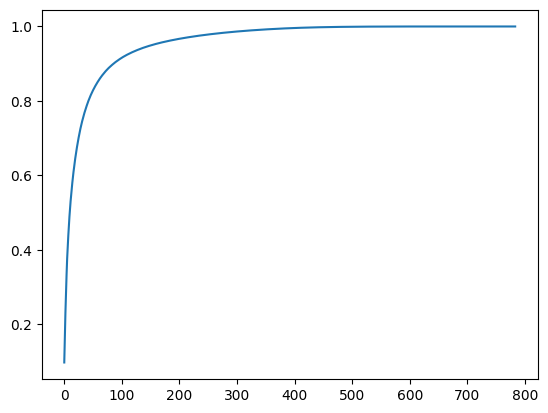

In [66]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))